In [4]:
import numpy as np 
import pandas as pd
import cv2 
from matplotlib import pyplot as plt 
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec
from pylab import imread
from skimage.color import rgb2gray

In [5]:
def ShowImage(ImageList, nRows = 1, nCols = 2, WidthSpace = 0.00, HeightSpace = 0.00):
    from matplotlib import pyplot as plt 
    import matplotlib.gridspec as gridspec
    
    gs = gridspec.GridSpec(nRows, nCols)     
    gs.update(wspace=WidthSpace, hspace=HeightSpace) # set the spacing between axes.
    plt.figure(figsize=(20,10))
    for i in range(len(ImageList)):
        ax1 = plt.subplot(gs[i])
        ax1.set_xticklabels([])
        ax1.set_yticklabels([])
        ax1.set_aspect('equal')

        plt.subplot(nRows, nCols,i+1)

        image = ImageList[i].copy()
        if (len(image.shape) < 3):
            plt.imshow(image, plt.cm.gray)
        else:
            plt.imshow(image)
        plt.title("Image " + str(i))
        plt.axis('off')

    plt.show()

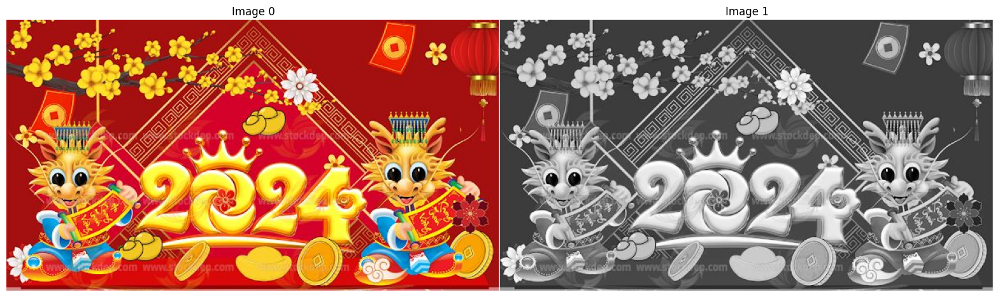

In [7]:
# Read Image 
image_color = imread("6d784d5bfc4e843ca9c8f52cbfaa6d2f.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
ShowImage([image_color, image_gray], 1, 2)

In [8]:
def Image3Dto2D(image):
    if(len(image.shape) >= 3):
        image_2D = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        image_2D = image.copy()
    return image_2D

In [9]:
# https://www.bogotobogo.com/python/OpenCV_Python/python_opencv3_Image_Fourier_Transform_FFT_DFT.php
def DFT_Transformation(image):
    img = Image3Dto2D(image) 

    img_float32 = np.float32(img)
    dft = cv2.dft(img_float32, flags = cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)
    magnitude_spectrum = 20*np.log(cv2.magnitude(dft_shift[:,:,0],dft_shift[:,:,1]))

    return magnitude_spectrum, dft_shift

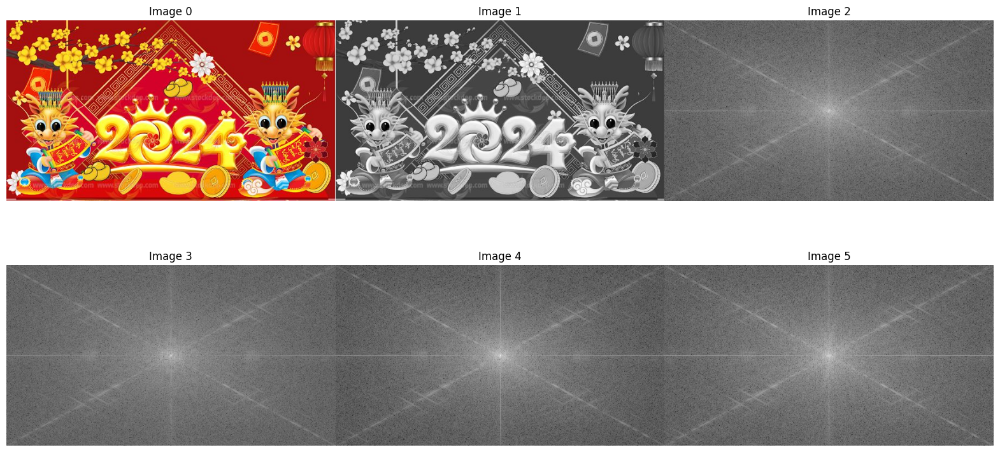

In [10]:
image_dft_frequency, dft_shift = DFT_Transformation(image_gray)
image_dft_frequency1, dft_shift1 = DFT_Transformation(image_color[:,:,0])
image_dft_frequency2, dft_shift2 = DFT_Transformation(image_color[:,:,1])
image_dft_frequency3, dft_shift3 = DFT_Transformation(image_color[:,:,2])
ShowImage([image_color, image_gray,  image_dft_frequency, image_dft_frequency1, image_dft_frequency2, image_dft_frequency3], 2, 3)

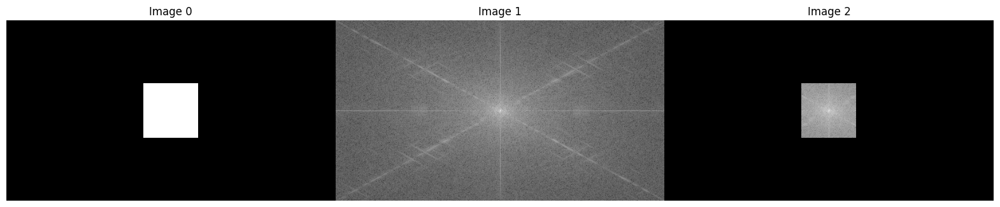

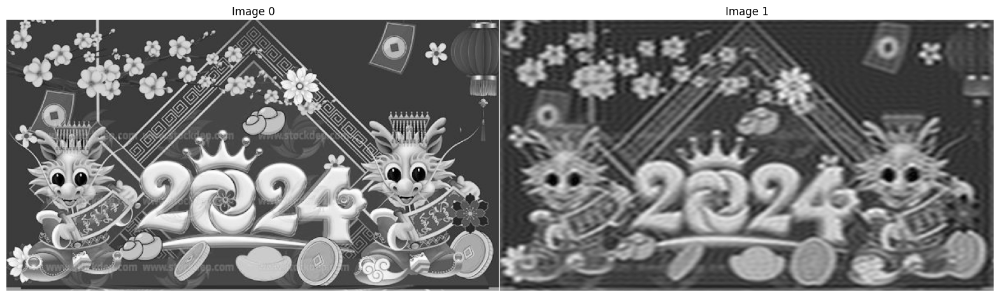

In [11]:
rows, cols = image_gray.shape
crow,ccol = (int)(rows/2) , (int)(cols/2)

# create a mask first, center square is 1, remaining all zeros
mask = np.zeros((rows, cols, 2), np.uint8)
size = 50
mask[crow-size:crow+size, ccol-size:ccol+size] = 1
image_dft_frequency_crop = image_dft_frequency* mask[:,:,0]

# apply mask and inverse DFT
fshift = dft_shift*mask
f_ishift = np.fft.ifftshift(fshift)
img_inverse = cv2.idft(f_ishift)
image_inverse = cv2.magnitude(img_inverse[:,:,0],img_inverse[:,:,1])

ShowImage([mask[:,:,0], image_dft_frequency, image_dft_frequency_crop], 1, 3)
ShowImage([image_gray, image_inverse], 1, 2)

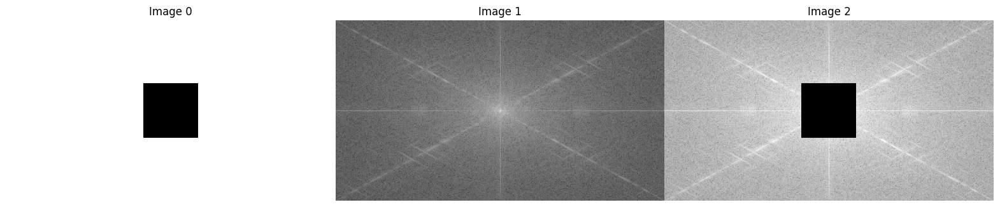

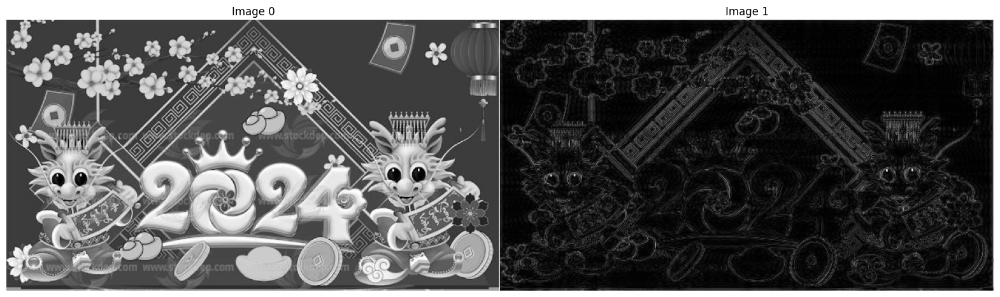

In [12]:
rows, cols = image_gray.shape
crow,ccol = (int)(rows/2) , (int)(cols/2)

# create a mask first, center square is 1, remaining all zeros
mask = np.zeros((rows, cols, 2), np.uint8)
size = 50
mask[crow-size:crow+size, ccol-size:ccol+size] = 1
mask = 1 - mask
image_dft_frequency_crop = image_dft_frequency* mask[:,:,0]

# apply mask and inverse DFT
fshift = dft_shift*mask
f_ishift = np.fft.ifftshift(fshift)
img_inverse = cv2.idft(f_ishift)
image_inverse = cv2.magnitude(img_inverse[:,:,0],img_inverse[:,:,1])

ShowImage([mask[:,:,0], image_dft_frequency, image_dft_frequency_crop], 1, 3)
ShowImage([image_gray, image_inverse], 1, 2)

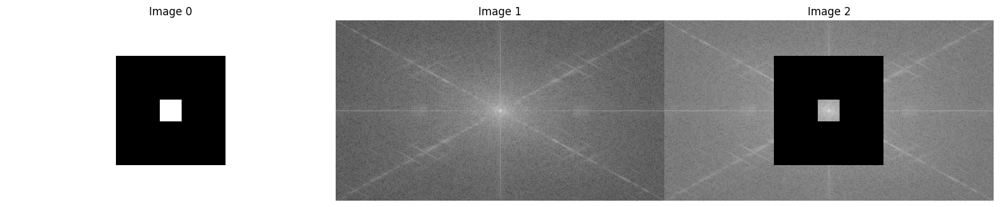

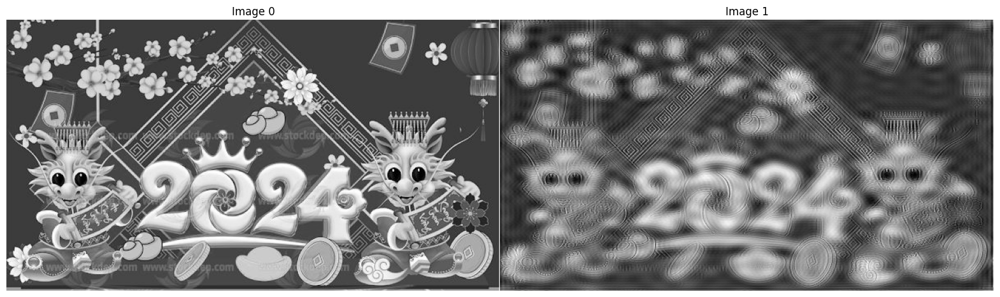

In [13]:
rows, cols = image_gray.shape
crow,ccol = (int)(rows/2) , (int)(cols/2)

# create a mask first, center square is 1, remaining all zeros
mask1 = np.zeros((rows, cols, 2), np.uint8)
mask2 = np.zeros((rows, cols, 2), np.uint8)

size = 20
mask1[crow-size:crow+size, ccol-size:ccol+size] = 1

size = 100
mask2[crow-size:crow+size, ccol-size:ccol+size] = 1


mask = np.zeros((rows, cols, 2), np.uint8)
mask[(mask1 == 1) | (mask2 == 0)] = 1

image_dft_frequency_crop = image_dft_frequency* mask[:,:,0]

# apply mask and inverse DFT
fshift = dft_shift*mask
f_ishift = np.fft.ifftshift(fshift)
img_inverse = cv2.idft(f_ishift)
image_inverse = cv2.magnitude(img_inverse[:,:,0],img_inverse[:,:,1])

ShowImage([mask[:,:,0], image_dft_frequency, image_dft_frequency_crop], 1, 3)
ShowImage([image_gray, image_inverse], 1, 2)

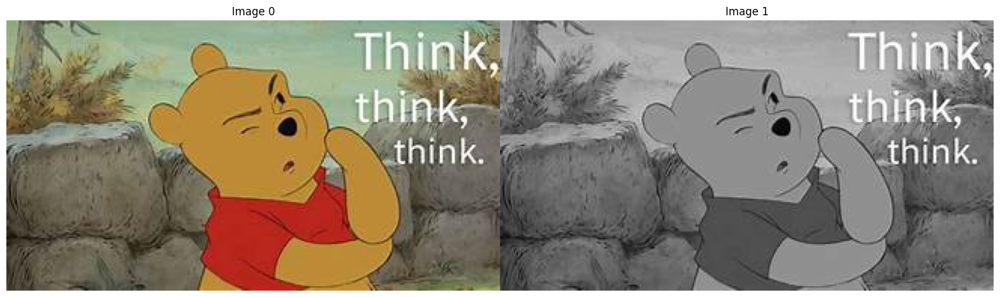

In [14]:
# Read Image 
image_color = imread("th.jfif")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
ShowImage([image_color, image_gray], 1, 2)

In [15]:
def dct2(a):
    import scipy
    return scipy.fftpack.dct( scipy.fftpack.dct( a, axis=0, norm='ortho' ), axis=1, norm='ortho' )

def idct2(a):
    import scipy
    return scipy.fftpack.idct( scipy.fftpack.idct( a, axis=0 , norm='ortho'), axis=1 , norm='ortho')

In [16]:
im = image_gray
imsize = im.shape
dct = np.zeros(imsize)

# Do 8x8 DCT on image (in-place)
for i in np.r_[:imsize[0]:8]:
    for j in np.r_[:imsize[1]:8]:
        dct[i:(i+8),j:(j+8)] = dct2( im[i:(i+8),j:(j+8)] )

Text(0.5, 1.0, 'An 8x8 DCT block')

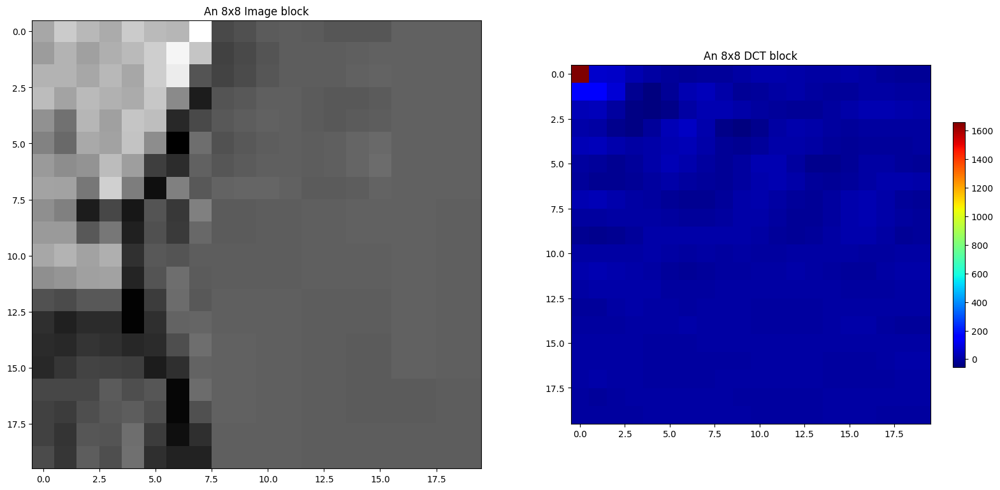

In [17]:
pos = 128
SampleBlock = im[pos:pos+20,pos:pos+20]
SampleDCT = dct2(SampleBlock)

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(SampleBlock,cmap='gray')
plt.title( "An 8x8 Image block")

# Display the dct of that block
plt.subplot(1,2,2)
plt.imshow(SampleDCT,cmap=cm.jet,interpolation='nearest')
plt.colorbar(shrink=0.5)
plt.title( "An 8x8 DCT block")

Text(0.5, 1.0, '8x8 DCTs of the image')

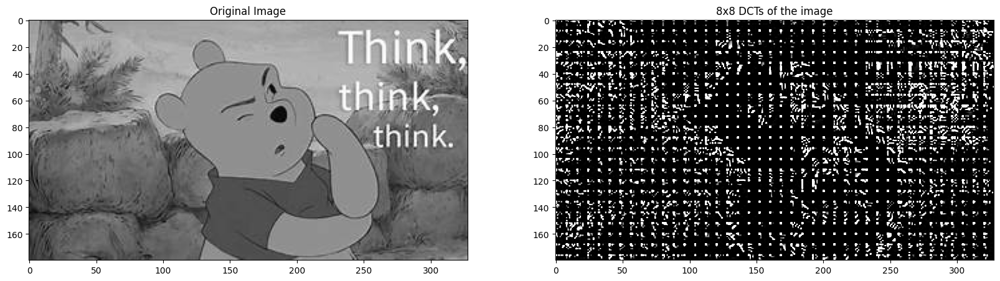

In [18]:
# Display entire DCT
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(image_gray, cmap = 'gray')
plt.title( "Original Image")
plt.subplot(1,2,2)
plt.imshow(dct,cmap='gray',vmax = np.max(dct)*0.01,vmin = 0)
plt.title( "8x8 DCTs of the image")

Keeping only 5.000000% of the DCT coefficients
Comparison between original and DCT compressed images


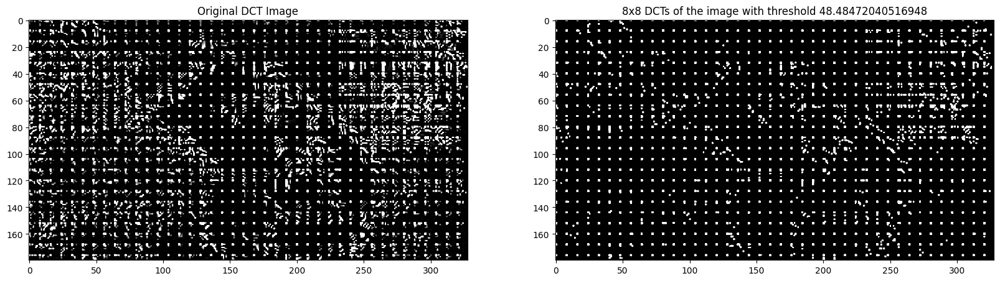

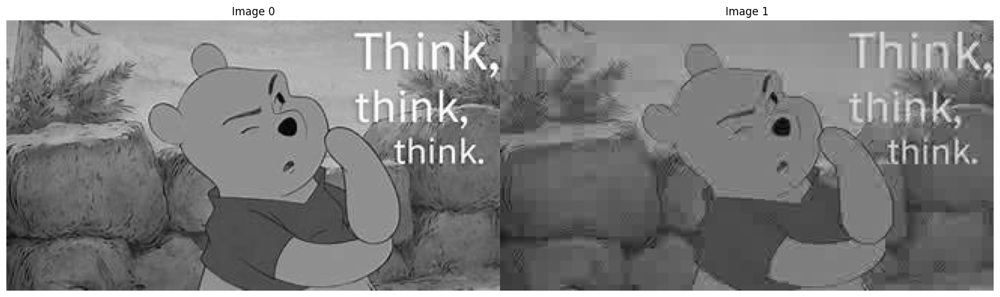

In [30]:
# Threshold
# Assuming im, dct, and imsize are defined somewhere before this code snippet

desired_percent_retention = 5.0 / 100.0
thresh = np.percentile(np.abs(dct), 100 - desired_percent_retention * 100)
dct_thresh = dct * (np.abs(dct) > thresh)

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(dct, cmap='gray', vmax=np.max(dct) * 0.01, vmin=0)
plt.title("Original DCT Image")
plt.subplot(1, 2, 2)
plt.imshow(dct_thresh, cmap='gray', vmax=np.max(dct) * 0.01, vmin=0)
plt.title("8x8 DCTs of the image with threshold " + str(thresh))

percent_nonzeros = np.sum(dct_thresh != 0.0) / (imsize[0] * imsize[1] * 1.0)
print("Keeping only %f%% of the DCT coefficients" % (percent_nonzeros * 100.0))

im_dct = np.zeros(imsize)
for i in np.r_[:imsize[0]:8]:
    for j in np.r_[:imsize[1]:8]:
        im_dct[i:(i + 8), j:(j + 8)] = idct2(dct_thresh[i:(i + 8), j:(j + 8)])

print("Comparison between original and DCT compressed images")
ShowImage([im, im_dct])


Keeping only 5.000000% of the DCT coefficients
Keeping only 5.000000% of the DFT coefficients
Comparison between original, DCT compressed, and DFT compressed images


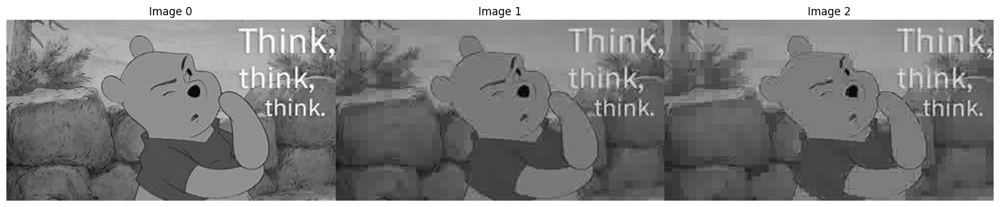

In [33]:

# Assuming im, imsize, and ShowImage are defined somewhere before this code snippet

dft = np.zeros(imsize, dtype='complex')
im_dft = np.zeros(imsize, dtype='complex')

# 8x8 DFT
for i in np.r_[:imsize[0]:8]:
    for j in np.r_[:imsize[1]:8]:
        dft[i:(i + 8), j:(j + 8)] = np.fft.fft2(im[i:(i + 8), j:(j + 8)])

# Threshold for keeping about 5% of the coefficients
desired_percent_retention = 5.0 / 100.0
thresh = np.percentile(np.abs(dft), 100 - desired_percent_retention * 100)
dft_thresh = dft * (np.abs(dft) > thresh)

percent_nonzeros_dft = np.sum(dft_thresh != 0.0) / (imsize[0] * imsize[1] * 1.0)
print("Keeping only %f%% of the DCT coefficients" % (percent_nonzeros * 100.0))
print("Keeping only %f%% of the DFT coefficients" % (percent_nonzeros_dft * 100.0))

# 8x8 iDFT
for i in np.r_[:imsize[0]:8]:
    for j in np.r_[:imsize[1]:8]:
        im_dft[i:(i + 8), j:(j + 8)] = np.fft.ifft2(dft_thresh[i:(i + 8), j:(j + 8)])

print("Comparison between original, DCT compressed, and DFT compressed images")
ShowImage([im, abs(im_dct), abs(im_dft)], 1, 3)


Compression Ratio: 1.0000


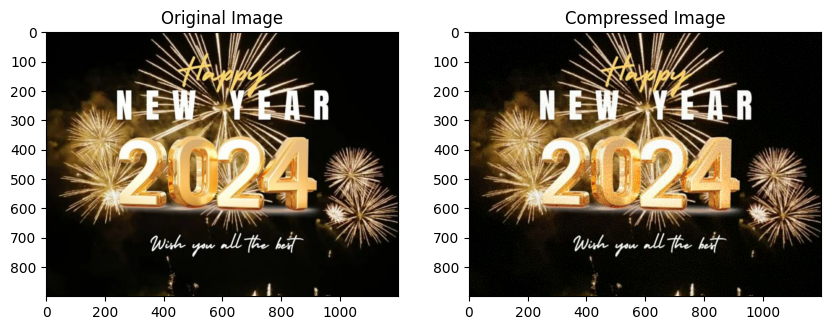

In [36]:
import numpy as np
import cv2
from scipy.fftpack import dct, idct

# Load a color image from the internet or local storage
# Replace 'image_path' with the actual path or URL of the image
image_path = 'Untitled-design-2023-12-31T202524.210.webp'
original_image = cv2.imread(image_path)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

# Convert the image to HSV color space
hsv_image = cv2.cvtColor(original_image, cv2.COLOR_RGB2HSV)

# Separate the channels
h, s, v = cv2.split(hsv_image)

# Define a function to perform DCT compression
def compress_dct(channel, retention_percentage=5):
    imsize = channel.shape
    dct_channel = dct(dct(channel, axis=0, norm='ortho'), axis=1, norm='ortho')

    # Threshold for keeping about 5% of the coefficients
    desired_percent_retention = retention_percentage / 100.0
    thresh = np.percentile(np.abs(dct_channel), 100 - desired_percent_retention * 100)
    dct_thresh = dct_channel * (np.abs(dct_channel) > thresh)

    # Inverse DCT to reconstruct the channel
    reconstructed_channel = idct(idct(dct_thresh, axis=0, norm='ortho'), axis=1, norm='ortho')
    return reconstructed_channel

# Perform DCT compression for each channel
compressed_h = compress_dct(h)
compressed_s = compress_dct(s)
compressed_v = compress_dct(v)

# Merge the compressed channels
compressed_image_hsv = cv2.merge([compressed_h, compressed_s, compressed_v])

# Convert back to 8-bit for saving
compressed_image_hsv_8bit = np.uint8(np.clip(compressed_image_hsv, 0, 255))

# Convert back to RGB
compressed_image_rgb = cv2.cvtColor(compressed_image_hsv_8bit, cv2.COLOR_HSV2RGB)

# Save the compressed image
output_path = 'path/to/your/output/folder/compressed_image.jpg'
cv2.imwrite(output_path, compressed_image_rgb)

# Calculate and print the compression ratio
original_size = original_image.nbytes
compressed_size = compressed_image_rgb.nbytes
compression_ratio = compressed_size / original_size
print(f"Compression Ratio: {compression_ratio:.4f}")

# Optionally, display the original and compressed images
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_image)
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.imshow(compressed_image_rgb)
plt.title("Compressed Image")

plt.show()
